# Analysis of Moscow's foodservice market

**PROJECT DESCRIPTION**

**Client:** "Shut Up and Take My Money" investment fund, which plans to open a foodservice establishment in Moscow.

**Research Objective:** To study the market in Moscow, identify interesting features, and present the findings that will assist in selecting a suitable location for potential investors.

**Research Tasks:**
 - Study the data and perform data preprocessing.
 - Analyze Moscow's foodservice market, identify patterns, and draw conclusions.
 - Conduct a detailed analysis of coffee shops and assess the feasibility of opening a coffee shop in Moscow.
 - Prepare a presentation for the client.

**Data Description**

For the research, a dataset of foodservice establishments in Moscow is provided. The dataset was compiled based on data from Yandex Maps and Yandex Business services, collected in the summer of 2022.

**File: moscow_places.csv:**
- name: the name of the establishment.
- address: the address of the establishment.
- category: the category of the establishment, such as "cafe," "pizza place," or "coffee shop."
- hours: information about the days and hours of operation.
- lat: latitude of the geographical location of the establishment.
- lng: longitude of the geographical location of the establishment.
- rating: the establishment's rating based on user reviews in Yandex Maps (highest rating is 5.0).
- price: price category of the establishment, such as "average," "below average," "above average," and so on.
- avg_bill: a string that represents the average order cost in a range format, for example:
     1. "Average bill: 1000–1500 ₽";
     2. "Price of a cup of cappuccino: 130–220 ₽";
     3. "Price of a beer glass: 400–600 ₽"
- middle_avg_bill: a number indicating the estimated average bill, which is only specified for values in the avg_bill column that start with the substring "Average bill."
If a price range of two values is given in the string, the column will contain the median of those two values.
If a single number is given in the string (without a range), that number will be entered in the column.
If there is no value or it doesn't start with the substring "Average bill," the column will be empty.
 - middle_coffee_cup: a number indicating the estimated price of a single cup of cappuccino, which is only specified for values in the avg_bill column that start with the substring "Price of a cup of cappuccino."
If a price range of two values is given in the string, the column will contain the median of those two values.
If a single number is given in the string (without a range), that number will be entered in the column.
If there is no value or it doesn't start with the substring "Price of a cup of cappuccino," the column will be empty.
- chain: a binary value (0 or 1) indicating whether the establishment is part of a chain (there may be errors for small chains):
0: the establishment is not part of a chain.
1: the establishment is part of a chain.
- district: the administrative district where the establishment is located, such as the Central Administrative District.
- seats: the number of seats available.

## Loading data

In [1]:
#импорт библиотек
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import json
from folium import Marker, Figure
from folium.plugins import MarkerCluster
import plotly.graph_objects as go
import datetime as dt
import regex as re
from folium import Map, Choropleth


In [2]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [3]:
#откроем датасет
df=pd.read_csv('/datasets/moscow_places.csv')
#выведем первые строки
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
#изучим информацию о датасете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Conclusions**

- The dataset contains information on 8406 establishments.
- Many columns have missing values. The columns with the most missing values are middle_coffee_cup, middle_avg_bill, and avg_bil. In total, there are missing values in 6 columns.
- All columns are named correctly, and there is no need for renaming.
- The data types of all columns are correct.

## Data preprocessing

### Changing the case in columns with string data type.

In [5]:
for i in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    df[i] = df[i].str.lower() 

### Handling duplicates

In [6]:
# посчитаем дубликаты
df.duplicated().sum()

0

Checking for duplicates in the columns with establishment names and addresses.

In [7]:
df.duplicated(subset=['name', 'address']).sum()

4

4 duplicates have been found. Let's remove them.

In [8]:
df.drop_duplicates(subset=['name', 'address'], keep=False, inplace=True)
df.duplicated(subset=['name', 'address']).sum()

0

### Handling missing values.

In [9]:
#  еще раз посмотрим на столбцы, где есть пропуски
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5083
avg_bill             4582
middle_avg_bill      5249
middle_coffee_cup    7863
chain                   0
seats                3609
dtype: int64

I agree, there are too many missing values to simply remove them as it would result in a significant loss of data. Filling them with synthetic data is also not ideal as it can distort the results.

### Handling anomalous values.

In [10]:
#  посмотрим на данные ближе
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8398.000000,8398.000000,8398.000000,3149.000000,535.000000,8398.000000,4789.000000
mean,55.750052,37.608655,4.230138,958.053668,174.721495,0.381281,108.301107
std,0.069650,0.098574,0.470292,1009.732845,88.951103,0.485730,122.848843
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.704875,37.538688,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753384,37.605286,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.794991,37.664834,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


In the "rating" column, the minimum value is 0.47, and the maximum value is 5.00, which seems reasonable. We can leave it as it is.

Regarding the "seats" column, there are outliers such as establishments with 1288 seats. Let's take a closer look at them.

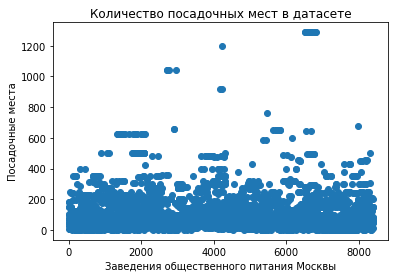

In [11]:
x_values = pd.Series(range(0,len(df['seats'])))
plt.scatter(x_values, df['seats']) 
plt.title("Количество посадочных мест в датасете")
plt.xlabel("Заведения общественного питания Москвы")
plt.ylabel("Посадочные места")
plt.show()

I have researched information about some establishments online, and none of them have such a large number of seats. Therefore, I will remove all values greater than 400 from the dataset.

Typically, establishments with an unusually high number of seats, such as 1288, are associated with a single address. This is likely due to errors in data entry.

In [12]:
df['seats'] = df['seats'].fillna(-1)
df = df.query('seats < 400')

Let's examine the information about the average bill:

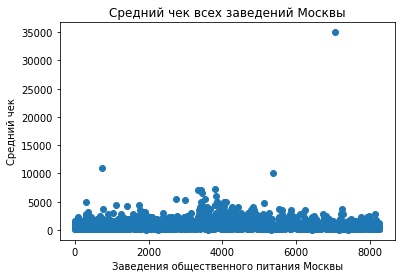

In [13]:
x_values = pd.Series(range(0,len(df['middle_avg_bill'])))
plt.scatter(x_values, df['middle_avg_bill']) 
plt.title("Средний чек всех заведений Москвы")
plt.xlabel("Заведения общественного питания Москвы")
plt.ylabel("Средний чек")
plt.show()

We can observe some clear outliers in the average bill column. Let's keep values that are less than 10,000.

In [14]:
df['middle_avg_bill'] = df['middle_avg_bill'].fillna(-1)
df = df.query('middle_avg_bill < 10000')

In [15]:
#вернем все на свои места
df['middle_avg_bill'] = df['middle_avg_bill'].replace(-1, np.nan)
df['seats'] = df['seats'].replace(-1, np.nan)

Let's examine the information about the price of a cup of cappuccino:

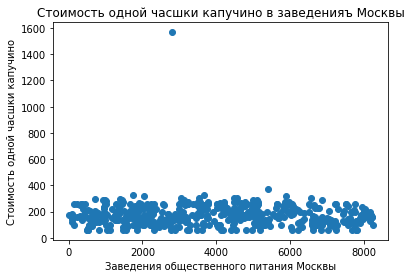

In [16]:
x_values = pd.Series(range(0,len(df['middle_coffee_cup'])))
plt.scatter(x_values, df['middle_coffee_cup']) 
plt.title("Стоимость одной часшки капучино в заведенияъ Москвы")
plt.xlabel("Заведения общественного питания Москвы")
plt.ylabel("Стоимость одной часшки капучино")
plt.show()

Here, we also have one outlier. Let's perform the same operation and keep values that are less than 10,000.

In [17]:
df['middle_coffee_cup'] = df['middle_coffee_cup'].fillna(-1)
df = df.query('middle_coffee_cup < 400')
df['middle_coffee_cup'] = df['middle_coffee_cup'].replace(-1, np.nan)

In [18]:
# check
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8262.000000,8262.000000,8262.000000,3086.000000,526.000000,8262.000000,4654.000000
mean,55.750214,37.609048,4.229496,935.722618,172.190114,0.380779,94.010529
std,0.069825,0.098826,0.472495,771.189578,65.533285,0.485608,79.791350
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.704950,37.539104,4.100000,375.000000,125.000000,0.000000,40.000000
50%,55.753604,37.606215,4.300000,700.000000,168.000000,0.000000,70.000000
75%,55.795353,37.665399,4.400000,1250.000000,225.000000,1.000000,120.000000
max,55.928943,37.874466,5.000000,7250.000000,375.000000,1.000000,398.000000


It seems that there are no more anomalies remaining.

### Adding new columns

In [19]:
# добавим столбец street с названиями улиц из столбца с адресом
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

df["street"] = df["address"].str.extract(str_pat, flags=re.I)

In [20]:
#создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
df['is_24/7'] = ''

for i, hours in enumerate(df['hours']):
    if hours == 'ежедневно, круглосуточно':
        df.loc[i, 'is_24/7'] = True
    else:
        df.loc[i, 'is_24/7'] = False

In [21]:
#check
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0.0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0.0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0.0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0.0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1.0,148.0,правобережная улица,False


**Conclusion**

During the data preprocessing stage, the case was changed in the columns, and then data was checked for duplicates (4 duplicates were found and removed).

Outliers were handled in three columns. In total, 1.7% of rows were lost during the data preprocessing.

Additional columns "street" and "is_24/7" were added for further analysis.

## Data analysis

### The most popular categories

Let's see what categories of establishments are represented in the data. We will explore the number of food service establishments by categories: restaurants, cafes, pizzerias, bars, and so on. We will create visualizations to depict this information. We will also answer the question about the distribution of establishments by category.

In [22]:
#создадим сводную таблицу
category_pivot = df.pivot_table(index='category', values='name', aggfunc = 'count').sort_values(by='name', ascending=False)
category_pivot


,name
category,
кафе,2342
ресторан,1997
кофейня,1392
"бар,паб",742
пиццерия,625
быстрое питание,599
столовая,312
булочная,253


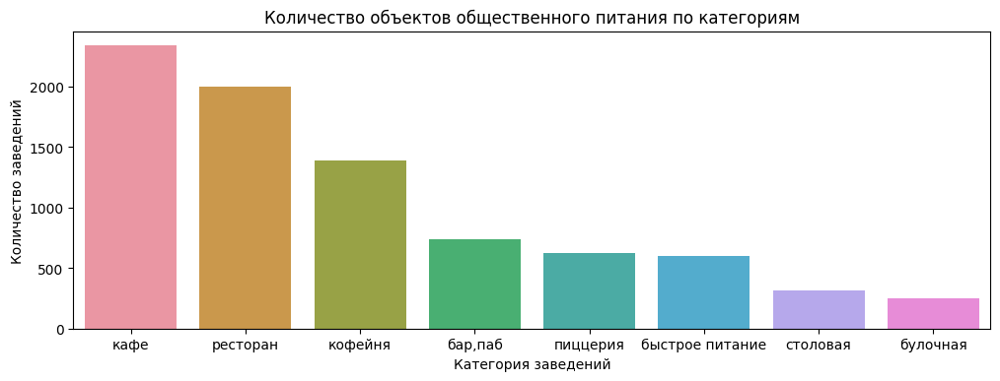

In [23]:
# задаем размеры и разрешение графика
plt.figure(figsize=(12, 4), dpi=100)

# строим столбчатую диаграмму
sns.set_palette('coolwarm') 
ax = sns.barplot(x=category_pivot.index, y='name', data=category_pivot)
ax.set(xlabel='Категория заведений', ylabel='Количество заведений')
ax.set_title('Количество объектов общественного питания по категориям');

The three most popular categories in Moscow are:
- Cafes: 2342 establishments
- Restaurants: 1997 establishments
- Coffee shops: 1392 establishments

On the other hand, bakeries, canteens, and fast food establishments are less common.

### The number of seats by categories

Sure, let's explore the number of seats in establishments by categories such as restaurants, cafes, pizzerias, bars, and others. We will create visualizations to depict this information.

In [24]:
# изучим какие данные встречаются в столбце seats
df['seats'].describe()

count    4654.000000
mean       94.010529
std        79.791350
min         0.000000
25%        40.000000
50%        70.000000
75%       120.000000
max       398.000000
Name: seats, dtype: float64

In [25]:
# создадим сводную таблицу и перестроим индекс
seats_pivot = df.pivot_table(index=['category'], values='seats', aggfunc='median').sort_values(by='seats', ascending=False)
seats_pivot = seats_pivot.reset_index()
seats_pivot

,category,seats
0,ресторан,83.0
1,"бар,паб",80.0
2,кофейня,75.0
3,столовая,75.0
4,быстрое питание,64.0
5,кафе,60.0
6,пиццерия,52.0
7,булочная,49.0


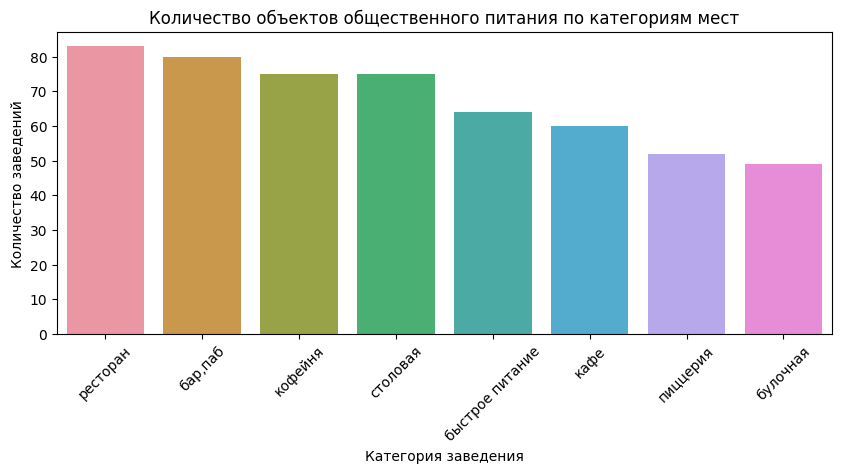

In [26]:
# задаем размеры и разрешение графика
plt.figure(figsize=(10, 4), dpi=100)

# строим столбчатую диаграмму
sns.set_palette('coolwarm') 
ax = sns.barplot(x='category', y='seats', data=seats_pivot)
ax.set(xlabel='Категория заведения', ylabel='Количество заведений')
ax.set_title('Количество объектов общественного питания по категориям мест');

# добавим легенду и повернем метки по оси X
plt.xticks(rotation=45);


The category with the highest number of seats is restaurants, with an average of 83 seats. Bars come in second place with an average of 80 seats. The third place is shared by canteens and coffee shops, both having an average of 75 seats. Pizzerias and bakeries have the fewest number of seats.

### The ratio of chain and independent establishments

Let's consider the ratio of networked and non-networked establishments in the dataset. Let's see which type of establishments is more common.

In [27]:
# создаем сводную таблицу и вычисляем доли
chain_pivot = df.pivot_table(index='chain', values='name', aggfunc='count').sort_values(by='name', ascending=False)

# создаем круговую диаграмму
fig = px.pie(chain_pivot, values='name', names=chain_pivot.index, title='Доля сетевых заведений')

# добавляем подписи к секторам
fig.update_traces(textposition='inside', textinfo='percent+label')

# отображаем график
fig.show()

As we can see, 62% are independent establishments, while 38% are chain establishments. Let's take a look at the distribution by categories.

### The ratio of chain and independent establishments by categories.

In [28]:
chain_pivot = df.groupby(['category'], as_index=False)['name'].agg('count')
chain_counts = df[df['chain'] == 1.0].groupby('category', as_index=False)['name'].agg('count')
chain_pivot = chain_pivot.merge(chain_counts, on='category', suffixes=('_total', '_chain'))
chain_pivot['share']=round(chain_pivot['name_chain']/chain_pivot['name_total']*100, 2)
chain_pivot = chain_pivot.sort_values(by='share', ascending=False)
chain_pivot

,category,name_total,name_chain,share
1,булочная,253,154,60.87
5,пиццерия,625,325,52.00
4,кофейня,1392,707,50.79
2,быстрое питание,599,231,38.56
6,ресторан,1997,712,35.65
3,кафе,2342,766,32.71
7,столовая,312,86,27.56
0,"бар,паб",742,165,22.24


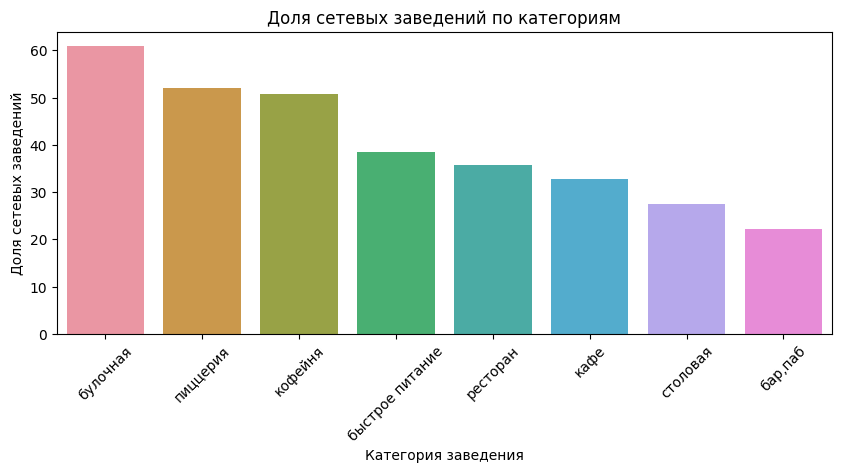

In [29]:
# задаем размеры и разрешение графика
plt.figure(figsize=(10, 4), dpi=100)

# строим столбчатую диаграмму
sns.set_palette('coolwarm') 
ax = sns.barplot(x='category', y='share', data=chain_pivot)
ax.set(xlabel='Категория заведения', ylabel='Доля сетевых заведений')
ax.set_title('Доля сетевых заведений по категориям');

# добавим легенду и повернем метки по оси X
plt.xticks(rotation=45);


If we look at the share of chain establishments by categories, we can see that bakeries, pizzerias, and coffee shops stand out (with over 50% being chain establishments). Canteens and bars are the least likely to be chain establishments

### Top 15 popular chains in Moscow

Let's group the data by establishment names and find the top 15 popular chains in Moscow. Popularity here refers to the number of establishments belonging to a particular chain in the region.

In [30]:
chain_places=df.pivot_table(index=['name'], values='chain', aggfunc='count')\
               .sort_values(by='chain', ascending=False)
top_15 = chain_places.query("name != 'кафе'& name !='хинкальная'& name !='чайхана'& name \
                            !='шаурма'& name !='ресторан'& name !='столовая'").head(15)
top_15

,chain
name,
шоколадница,116
домино'с пицца,77
додо пицца,73
one price coffee,71
яндекс лавка,68
cofix,64
prime,48
кофепорт,42
теремок,38


We have identified the top 15 popular chains, excluding generic names such as "cafe" and "restaurant" from the list.

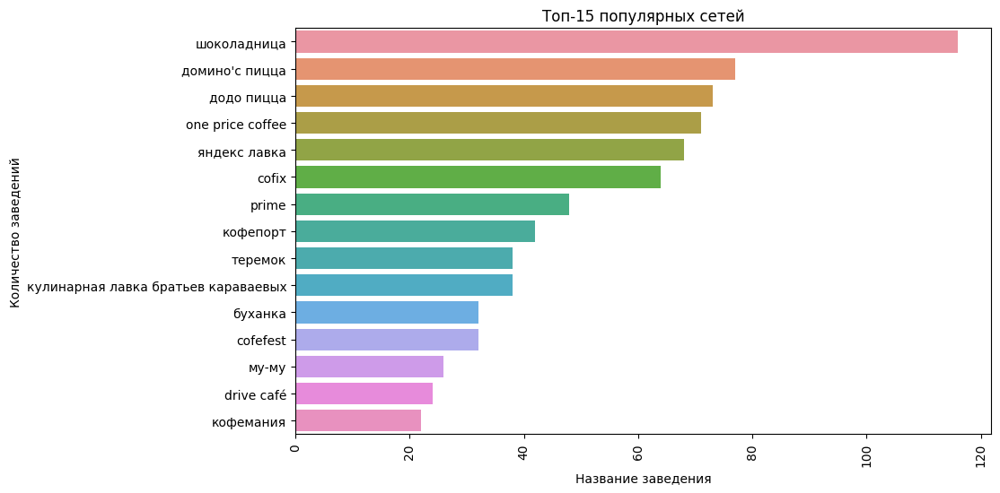

In [31]:
# задаем размеры и разрешение графика
plt.figure(figsize=(10, 6), dpi=100)

# строим столбчатую диаграмму
sns.set_palette('coolwarm') 
ax = sns.barplot(y=top_15.index, x='chain', data=top_15)
ax.set(xlabel='Название заведения', ylabel='Количество заведений')
ax.set_title('Топ-15 популярных сетей')
plt.xticks(rotation=90);

The most popular chain in Moscow is "Shokoladnitsa" with 116 establishments. It is followed by "Domino's Pizza," "Dodo Pizza," "One Price Coffee," and "Yandex.Lavka."

Typically, these are coffee shops and pizzerias that are quite well-known in Moscow.

### Analysis of establishments by administrative districts in Moscow

Let's see which administrative districts of Moscow are present in the dataset. We will display the total number of establishments and the number of establishments in each category by district.

In [32]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ', nan], dtype=object)

A total of 9 districts of Moscow are present in the dataset. Let's see which establishments are represented there.

In [33]:
# создаем сводную таблицу
district_total = df.pivot_table(index=['district','category'], values='name', aggfunc='count')\
                   .sort_values(by='name', ascending=False)
district_total = district_total.reset_index()
district_total['total'] = district_total.sum(axis=1)
dfs = district_total.groupby('district').sum()

# строим столбчатую диаграмму
fig = px.bar(district_total, x='district', y='total', color='category', \
             title='Категории заведений по районам', height=800, width=900,)

fig.add_trace(go.Scatter(
    x=dfs.index, 
    y=dfs['name'],
    text=dfs['name'],
    mode='text',
    textposition='top center',
    textfont=dict(
        size=18,
    ),
    showlegend=False
))

# задаем подписи осей
fig.update_xaxes(title_text='Округ')
fig.update_yaxes(title_text='Количество заведений')

# поворачиваем метки по оси X
fig.update_layout(xaxis_tickangle=-45)

# отображаем диаграмму
fig.show()


We can observe that restaurants, cafes, and coffee shops are the most common in each district. Bakeries and canteens are the least common. The districts with the highest number of establishments are the Central, Northeastern, Southern, and Northern districts. Among them, the Central district stands out significantly with 2,195 establishments.

### Distribution of average ratings by establishment categories

Let's visualize the distribution of average ratings by establishment categories.

In [34]:
# создаем сводную таблицу
rating_total = df.pivot_table(index=['category'], values='rating', aggfunc='mean')\
                   .sort_values(by='rating', ascending=False)
rating_total = rating_total.reset_index()
rating_total['rating'] = round(rating_total['rating'], 2)
# строим столбчатую диаграмму
fig = px.bar(rating_total, x='category', y='rating', text='rating', color='category', \
             title='Распределение средних рейтингов по категориям заведений', height=800, width=900)

# задаем подписи осей
fig.update_xaxes(title_text='Округ')
fig.update_yaxes(title_text='Количество заведений')

# поворачиваем метки по оси X
fig.update_layout(xaxis_tickangle=-45)

# ограничиваем ось y
fig.update_yaxes(range=[3.8, 4.6])

# отображаем диаграмму
fig.show()


On average, all categories of establishments have ratings ranging from 4.05 to 4.39, with ratings not differing significantly. However, bars/pubs lead with an average rating of 4.39, followed by pizzerias and restaurants. Fast food establishments have the lowest rating of 4.05.

In [35]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [36]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    data=rating_df,
    geo_data=state_geo,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    name='rating',
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

The highest rating is found in the Central district with a rating of 4.4. The lowest rating is found in the Northeastern and Southeastern districts. Overall, the ratings do not differ significantly.

### All establishments in Moscow on the map

Let's visualize all the establishments in the dataset on a map.

In [37]:
# проверяем датафрейм на наличие NaN-значений в столбцах 'lat' и 'lng'
mask = df['lat'].isna() | df['lng'].isna()

# удаляем строки с NaN-значениями
df = df[~mask]

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

The majority of establishments are concentrated in the city center, while the fewest establishments are found in the Southern and Southeastern districts.

### Top 15 streets by the number of establishments

Let's find the top 15 streets with the highest number of establishments. We will plot a graph showing the distribution of the number of establishments and their categories on these streets.

In [38]:
streets = df.groupby('street').agg(count=('name', 'count')).sort_values(
    'count', ascending=False).head(15).index.tolist()
street_category = df[df['street'].isin(streets)].groupby(['street', 'category'], as_index=False).agg(
    count=('name', 'count')).sort_values('count', ascending=False)
street_category

,street,category,count
80,проспект мира,кафе,53
83,проспект мира,ресторан,44
81,проспект мира,кофейня,36
88,профсоюзная улица,кафе,35
75,проспект вернадского,ресторан,29
...,...,...,...
66,люблинская улица,пиццерия,1
7,алтуфьевское шоссе,столовая,1
1,алтуфьевское шоссе,булочная,1
70,проспект вернадского,булочная,1


In [39]:

street_category['total'] = street_category.sum(axis=1)
dfs = street_category.groupby('street').sum()

# строим столбчатую диаграмму
fig = px.bar(street_category, x='street', y='total', color='category', \
             title='Топ-15 улиц по количеству заведений', height=800, width=900,)

fig.add_trace(go.Scatter(
    x=dfs.index, 
    y=dfs['total'],
    text=dfs['total'],
    mode='text',
    textposition='top center',
    textfont=dict(
        size=18,
    ),
    showlegend=False
))

# задаем подписи осей
fig.update_xaxes(title_text='Улица')
fig.update_yaxes(title_text='Количество заведений')

# поворачиваем метки по оси X
fig.update_layout(xaxis_tickangle=-45)

# отображаем диаграмму
fig.show()

The most popular streets are:

- Prospekt Mira (182 establishments)
- Profsoyuznaya Street (122 establishments)
- Leninsky Prospekt (101 establishments)

The most common categories are cafes, restaurants, and coffee shops.

### Streets with 1 establishment

Let's find the streets where only one food service establishment is located.

In [40]:
single_place = df.groupby('street').agg(count=('name', 'count')).sort_values(
    'count', ascending=False).query('count == 1').index.tolist()
single_place = df[df['street'].isin(single_place)].groupby(['street', 'category'], as_index=False).agg(
    count=('name', 'count')).sort_values('count', ascending=False)

# Оставляем только категорию и общее количество улиц
single_place = single_place[['category', 'count']].groupby('category', as_index=False).sum()
single_place = single_place.sort_values('count', ascending=False)

single_place


,category,count
3,кафе,137
6,ресторан,88
4,кофейня,74
0,"бар,паб",40
7,столовая,36
2,быстрое питание,17
5,пиццерия,14
1,булочная,9


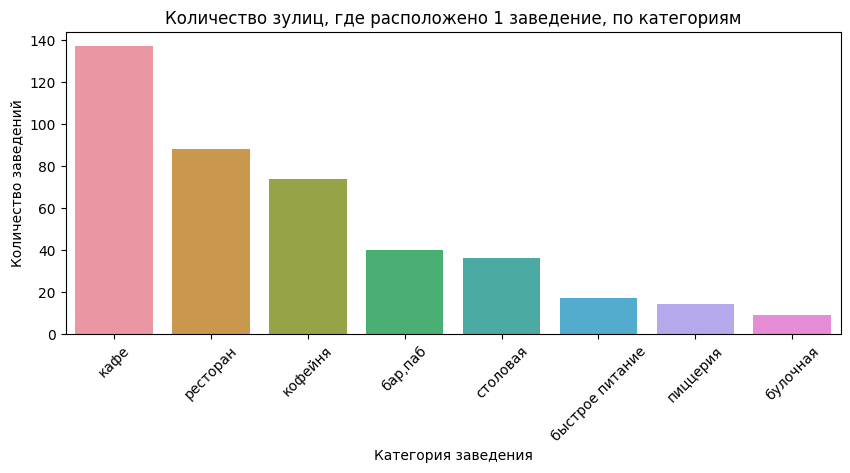

In [41]:
# задаем размеры и разрешение графика
plt.figure(figsize=(10, 4), dpi=100)

# строим столбчатую диаграмму
sns.set_palette('coolwarm') 
ax = sns.barplot(x='category', y='count', data=single_place)
ax.set(xlabel='Категория заведения', ylabel='Количество заведений')
ax.set_title('Количество зулиц, где расположено 1 заведение, по категориям');

# добавим легенду и повернем метки по оси X
plt.xticks(rotation=45);

There are a total of 415 streets with only one establishment. We can see that cafes, restaurants, and coffee shops are more commonly found on streets with only one establishment, while bakeries and pizzerias are less common.

### Average check prices by district

Let's calculate the median value of this column for each district. We will create a choropleth map with the obtained values for each district. We will analyze the prices in the Central Administrative District (CAD) compared to other districts. We will see how the distance from the city center affects the prices in the establishments.



In [42]:
avg_bill_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
avg_bill_df

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [43]:
# создаём карту Москвы
moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    data=avg_bill_df,
    geo_data=state_geo,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    name='middle_avg_bill',
    legend_name='Медианный средний чек заведений по районам',
).add_to(moscow)

# выводим карту
moscow

The highest average check price is found in the Central Administrative District, which is logical. However, the Western District also stands out with relatively high prices. The lowest average check price is found in the Southern, Southeastern, and Northeastern districts.

### Conclusions

The three most popular categories in Moscow are:

- Cafes - 2342 establishments
- Restaurants - 1997 establishments
- Coffee shops - 1392 establishments
- Bakeries, canteens, and fast food establishments are less common.

Restaurants have the highest average number of seats, with an average of 83 seats. Bars rank second with an average of 80 seats. Canteens and coffee shops share the third place with an average of 75 seats. Pizzerias and bakeries have the fewest seats.

62% of establishments are independent, while 38% are part of a chain. Cafes, restaurants, bars, pubs, fast food establishments, and canteens are typically independent. Coffee shops and bakeries stand out as chain establishments. When considering the proportion of chain establishments by category, bakeries, pizzerias, and coffee shops have a higher percentage of chain establishments (over 50%). Canteens and bars are the least likely to be chain establishments.

The most popular chain in Moscow is "Shokoladnitsa" with 116 establishments. It is followed by "Domino's Pizza," "Dodo Pizza," "One Price Coffee," and "Yandex.Lavka." These chains are typically coffee shops and pizzerias and are well-known in Moscow.

In each district, restaurants, cafes, and coffee shops are the most common. Bakeries and canteens are the least common. The districts with the highest number of establishments are the Central, Northeastern, Southern, and Northern districts. The Central district stands out significantly with 2195 establishments.

On average, establishments in all categories have ratings ranging from 4.05 to 4.39, with ratings not differing significantly. However, bars/pubs have the highest average rating of 4.39, followed by pizzerias and restaurants. Fast food establishments have the lowest average rating of 4.05.

The Central district has the highest rating with a score of 4.4, while the Northeastern and Southeastern districts have the lowest ratings. Overall, the ratings do not differ significantly.

The most popular streets with the highest number of establishments are:
- Prospekt Mira (182 establishments)
- Profsoyuznaya Street (122 establishments)
- Leninsky Prospekt (101 establishments)
- The most common categories in these areas are cafes, restaurants, and coffee shops.

There are a total of 415 streets with only one food service establishment. More commonly, these streets have cafes, restaurants, and coffee shops, while bakeries and pizzerias are less common.

The highest average check prices are found in the Central district, which is expected, but the Western district also stands out with relatively high prices. The lowest average check prices are found in the Southern, Southeastern, and Northeastern districts.

## Detailed Study: Opening a Coffee Shop

Let's examine whether it is reasonable to open a coffee shop in Moscow.

### Number of Coffee Shops in Moscow by Districts

Let's see how many coffee shops are in the dataset and which districts have the highest numbers of coffee shops, as well as any particular characteristics of their locations.

In [44]:
coffee_shops = df[df['category'] == 'кофейня'].groupby('district', as_index=False)['name'].agg('count')
coffee_shops


,district,name
0,Восточный административный округ,103
1,Западный административный округ,146
2,Северный административный округ,186
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,422
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,95
8,Южный административный округ,130


In [45]:
# создаём карту Москвы
moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    data=coffee_shops,
    geo_data=state_geo,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    name='name',
    legend_name='Количество кофеен по районам',
).add_to(moscow)

# выводим карту
moscow

In [46]:
print('Всего в датасете:', coffee_shops['name'].sum(), 'кофеен')

Всего в датасете: 1392 кофеен


There are a total of 1392 coffee shops in the dataset. The Central district has the highest number of coffee shops with 422 establishments. The second and third places are occupied by the Northern district with 186 coffee shops and the Northeastern district with 159 coffee shops.

### 24-Hour Coffee Shops

In [47]:
# создадим сводную таблицу
coffee_shops_247 = df[(df['category'] == 'кофейня') & (df['hours'] == 'ежедневно, круглосуточно')]\
                       .groupby('district', as_index=False)['name'].agg('count')
# посмотрим какой процент круглосуточных кофеен
share_247=round((coffee_shops_247['name'].sum()*100)/coffee_shops['name'].sum(), 2)
share_247

4.24

In [48]:
# создаём карту Москвы
moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    data=coffee_shops_247,
    geo_data=state_geo,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    name='name',
    legend_name='Количество  круглосуточных кофеен по районам',
).add_to(moscow)

# выводим карту
moscow

Only 4.24% of coffee shops in Moscow operate 24 hours. They are more common in the Central, Western, and Southwest districts. They are less common in the Eastern and Northern parts of Moscow.



### Ratings of Coffee Shops by Districts

In [49]:
rating_coffee_shops = df[df['category'] == 'кофейня'].groupby('district', as_index=False)['rating'].agg('mean')

# создаём карту Москвы
moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    data=rating_coffee_shops,
    geo_data=state_geo,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    name='rating',
    legend_name='Рейтинги кофеен по районам',
).add_to(moscow)

# выводим карту
moscow

The highest ratings for coffee shops are found in the Central and Northwest districts. The Northern district also has high ratings. The lowest ratings are observed in the Western and Northeastern districts.

### Average Cost of a Cup of Coffee


In [50]:
middle_cup_coffee_shops = df[df['category'] == 'кофейня'].groupby('district', as_index=False)['middle_coffee_cup'].agg('median')

In [51]:

# создаём карту Москвы
moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    data=middle_cup_coffee_shops,
    geo_data=state_geo,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    name='middle_coffee_cup',
    legend_name='Рейтинги кофеен по районам',
).add_to(moscow)

# выводим карту
moscow

The highest average cost for a cup of cappuccino is in the Central district. The cost is also high in the Western and Southwest districts. The cheapest coffee can be found in the Eastern district. On average, when opening a coffee shop, you can consider pricing a cup of cappuccino around 160-180 rubles.

### Conclusions

In the dataset, there are a total of 1392 coffee shops. The highest number of coffee shops is in the Central District, with 422 establishments. The second and third places are occupied by the Northern District with 186 coffee shops and the Northeastern District with 159 coffee shops.

Only 4.24% of the coffee shops in Moscow are open 24 hours. They are most commonly found in the Central, Western, and Southwest districts, while they are less common in the Eastern and Northern parts of Moscow.

The coffee shops in the Central and Northwest districts have the highest ratings. The Northern District also has high ratings, while the lowest ratings are found in the Western and Northeastern districts.

The highest cost for a cup of cappuccino is in the Central District, with relatively high prices in the Western and Southwest districts. The cheapest option for coffee is in the Eastern District. When opening a new coffee shop, it is advisable to consider prices ranging from 160 to 180 rubles per cup of cappuccino, depending on the district.

### Recommendations

Currently, the most promising district for opening a coffee shop appears to be the Southwest District. Here are the main reasons:

1. In terms of the total number of establishments, the Southwest Administrative Okrug (SZAO) ranks second to last, with only 719 establishments.
2. Moreover, in terms of the number of coffee shops, this district also ranks among the lowest.
3. If we consider the population density in this district (according to Wikipedia), the Southwest District has the highest population density, reaching over 25,000 people per square kilometer in some areas.
4. In terms of population size, this district is also within the top five districts in Moscow.
5. Additionally, I have researched the districts of Moscow based on the residents' income levels online, and it states that "people with high incomes tend to choose the city center, Southwest, and West of Moscow" – another confirmation in favor of the Southwest District.
6. The Southwest District has an average rating among coffee shops, allowing for differentiation from competitors. When comparing ratings across all categories, the Southwest District has a lower rating compared to other districts, which is also a positive sign for the emergence of a good coffee shop.
7. The average cost of a cup of tea in this district is one of the highest. You can consider pricing around 180 rubles.
8. When examining in more detail, it is advisable to select streets with less competition but good foot traffic.



In [52]:
# создадим сводную таблицу
coffee_shops_uzao = df[(df['category'] == 'кофейня') & (df['district'] == 'Юго-Западный административный округ')]
coffee_shops_uzao


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
5736,название забыл,кофейня,"москва, ленинский проспект, 86",Юго-Западный административный округ,"пн-пт 08:20–21:30; сб,вс 10:00–21:30",55.678236,37.528582,4.7,средние,NaN,NaN,NaN,0.0,NaN,ленинский проспект,True
5891,foodmoscowcoffee,кофейня,"москва, ленинский проспект (дублёр)",Юго-Западный административный округ,"ежедневно, круглосуточно",55.703333,37.573414,4.1,NaN,NaN,NaN,NaN,0.0,NaN,NaN,False
5892,cafe pantheon,кофейня,"москва, ленинский проспект, 34/1",Юго-Западный административный округ,"пн-пт 08:30–21:30; сб,вс 10:00–22:00",55.706335,37.576358,4.6,средние,цена чашки капучино:180–250 ₽,NaN,215.0,0.0,4.0,ленинский проспект,False
5897,grinvich coffee room,кофейня,"москва, ленинский проспект, 34/1",Юго-Западный административный округ,"пн-пт 08:30–21:00; сб,вс 10:00–21:00",55.706723,37.577123,4.6,средние,цена чашки капучино:230–250 ₽,NaN,240.0,0.0,4.0,ленинский проспект,False
5898,tennis cup кофе,кофейня,"москва, ленинский проспект, 38а",Юго-Западный административный округ,пн-пт 09:00–18:00,55.704550,37.569980,4.4,средние,средний счёт:200–500 ₽,350.0,NaN,0.0,NaN,ленинский проспект,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7668,wild bean,кофейня,"москва, мкад, 41-й километр, 18, стр. 1",Юго-Западный административный округ,"ежедневно, круглосуточно",55.618872,37.484253,4.3,NaN,NaN,NaN,NaN,1.0,NaN,NaN,False
7670,шоколадница,кофейня,"москва, профсоюзная улица, 129а",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.619023,37.506517,4.1,NaN,NaN,NaN,NaN,1.0,180.0,профсоюзная улица,True
7706,one price coffee,кофейня,"москва, новоясеневский проспект, 1",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.619966,37.508499,4.0,NaN,NaN,NaN,NaN,1.0,180.0,новоясеневский проспект,False
7726,cofefest,кофейня,"москва, улица тёплый стан, 13к2",Юго-Западный административный округ,пн-пт 08:00–19:00,55.623880,37.488853,3.8,NaN,NaN,NaN,NaN,1.0,NaN,улица тёплый стан,False


In [53]:
# подключаем библиотеку
from folium import Marker

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffee_shops_uzao.apply(create_marker, axis=1)
    
# выводим карту
m

In [54]:
coffee_shops_uzao = df[(df['category'] == 'кофейня') & (df['district'] == 'Юго-Западный административный округ')]\
                       .groupby('street', as_index=False)['name'].agg('count')
coffee_shops_uzao

,street,name
0,большая черёмушкинская улица,3
1,ленинский проспект,18
2,ломоносовский проспект,1
3,молодёжная улица,1
4,научный проезд,1
5,нахимовский проспект,1
6,новочерёмушкинская улица,4
7,новоясеневский проспект,4
8,проспект 60-летия октября,1
9,профсоюзная улица,18


Promising streets:
- Vilniusskaya Street (residential area)
- Sivashskaya Street (near a large residential area with few competitors)
- Shvernika Street (close to the city center, few competitors nearby, adjacent to a park)

I would consider the Konkovo district as the most promising location. It has few competitors, especially among coffee shops, and the area itself is quiet and cozy.

## Presentation

https://drive.google.com/file/d/1AxBH4WNhF22c0xJfVKx1X0tb6Y0cd234/view?usp=sharing